# Network Analysis of Twitter data, from Grubhub, UberEats, and DoorDash


## Annie Ludlow
## 4/16/2019


In [1]:
# imports
import glob
import os 
import shutil
import zipfile
import json 
import csv

## Building a mention network 

In [2]:
#create a temporary directory for each script, in order to avoid permantly changing the original data
TMPDIR = 'tmp'

In [3]:
if not os.path.exists(TMPDIR):
    os.makedirs(TMPDIR)

In [4]:
tweetzipfiles = glob.glob('*.zip')

In [5]:
#unzip the temp files pulled for each brand
for tweetzipfile in tweetzipfiles:
    with zipfile.ZipFile(tweetzipfile, 'r') as f:
        print('Unzipping to tmp directory: %s' % tweetzipfile)
        f.extractall(TMPDIR)

Unzipping to tmp directory: DoorDash.zip
Unzipping to tmp directory: UberEats.zip
Unzipping to tmp directory: Grubhub.zip


In [6]:
#extract the users twitter handle from the data
uniqueusers = {}
count = 0
for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        count += 1
        if count % 1000 == 0:
            print(count)
        tweetjson = json.load(f)
        userwhotweeted = tweetjson['user']['screen_name']
        
        if userwhotweeted in uniqueusers:
            uniqueusers[userwhotweeted] += 1
        if userwhotweeted not in uniqueusers:
            uniqueusers[userwhotweeted] = 1

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000


In [7]:
#the length of users 
len(uniqueusers)

15045

In [8]:
# find users who tweet more than twice 
userstoinclude = set()
usercount = 0
#>2 is the parameter -- users who tweeted more than twice
for auser in uniqueusers:
    if uniqueusers[auser] >2:
        usercount += 1 
        userstoinclude.add(auser)
print(len(userstoinclude))

927


In [9]:
#write the csv file for the edgelist and include headers 
edgelist= open('mention.edgelist.for.gephi.csv', 'w')
csvwriter = csv.writer(edgelist)
header = ['Source', 'Target']
csvwriter.writerow(header)

15

In [10]:
#go through each tweet one at a time and create edge list 
print('Writing edge list')
count = 0
for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        userwhotweeted = tweetjson['user']['screen_name']
        if userwhotweeted in userstoinclude:
            count += 1
            if count % 1000 == 0:
                print(count)
           #list of the users that are mentioned in the tweet, not including tweets without users. 
            #each row is username and user who is mentioned
            users = tweetjson['entities']['user_mentions']
            if len(users) >0:
                for auser in users:
                    screenname = auser['screen_name']
                    row = [userwhotweeted, screenname]
                    csvwriter.writerow(row)
edgelist.close()

Writing edge list
1000
2000
3000
4000
5000
6000
7000
8000


In [11]:
from IPython.display import Image


## Visualization produced in Gephi, showing the clusters associated with the mention network created above.

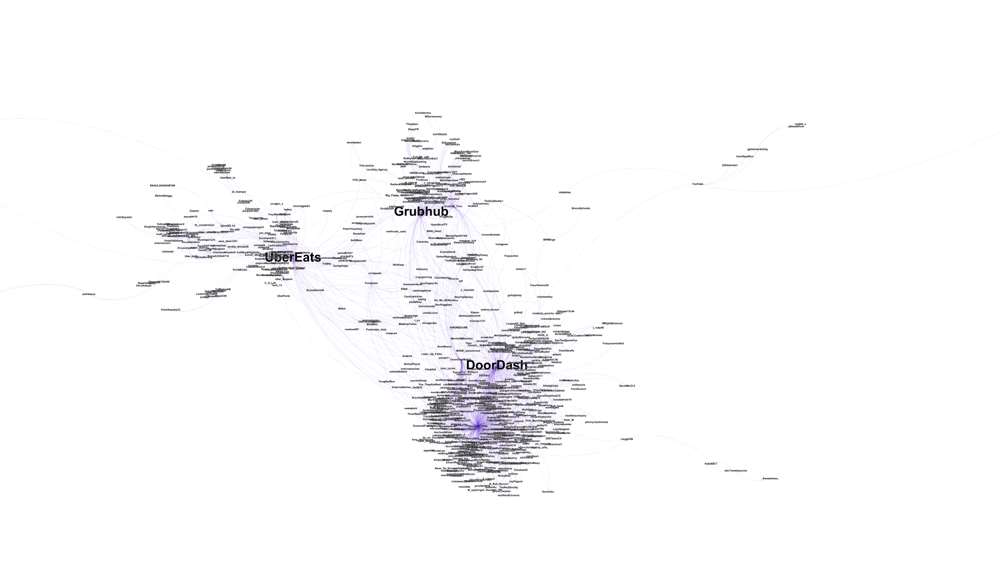

In [12]:
Image(filename='MentionWholeCluster.png', width=700, height=700)

You can see from this visualization three clear clusters that are associated with each brand. Below are closer shots of the three clusters, where you can see who the users are that are tweeting at the brands most often. 

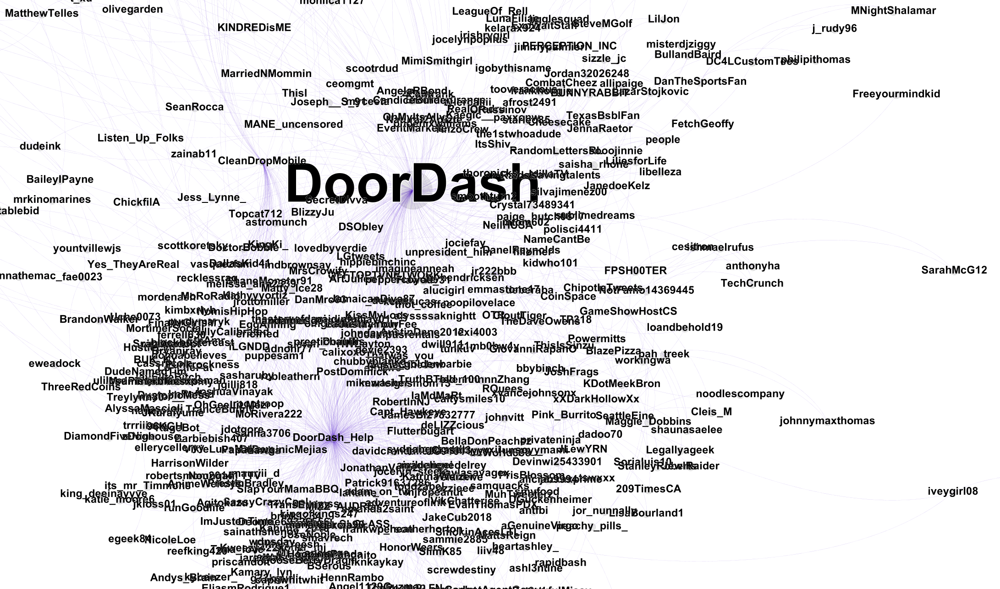

In [13]:
Image(filename='MentionDoorDash.png', width=700, height=700)

DoorDash is unique from the others, because they have two highly used twitter handles, "DoorDash" and "DoorDash_Help". You can see from the visualization that both are used a fairly even amount, however for the purpose of this project, I chose to just highlight the original DoorDash handle for any analysis. 

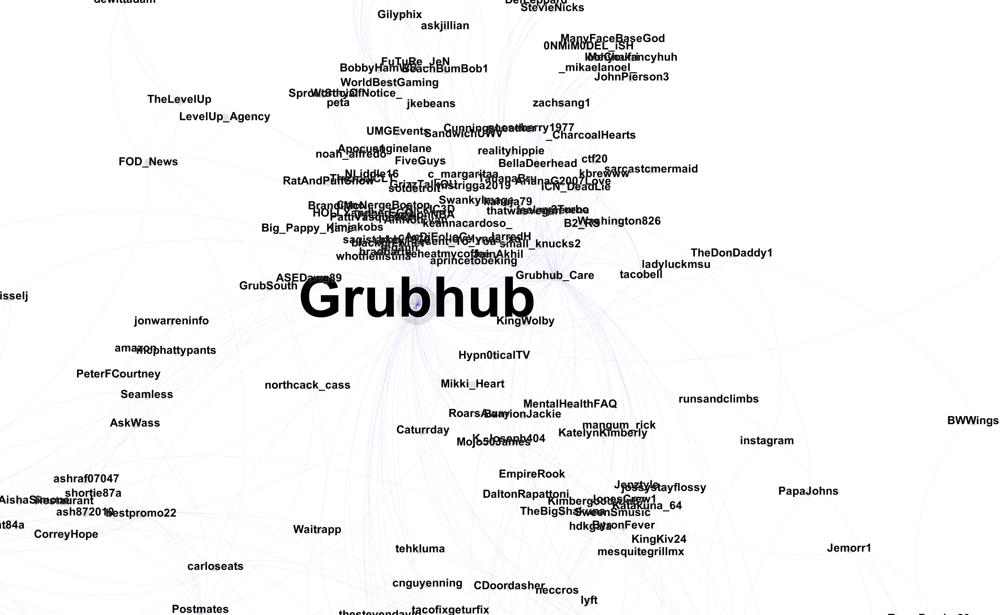

In [14]:
Image(filename='MentionGrubhub.png', width=700, height=700)

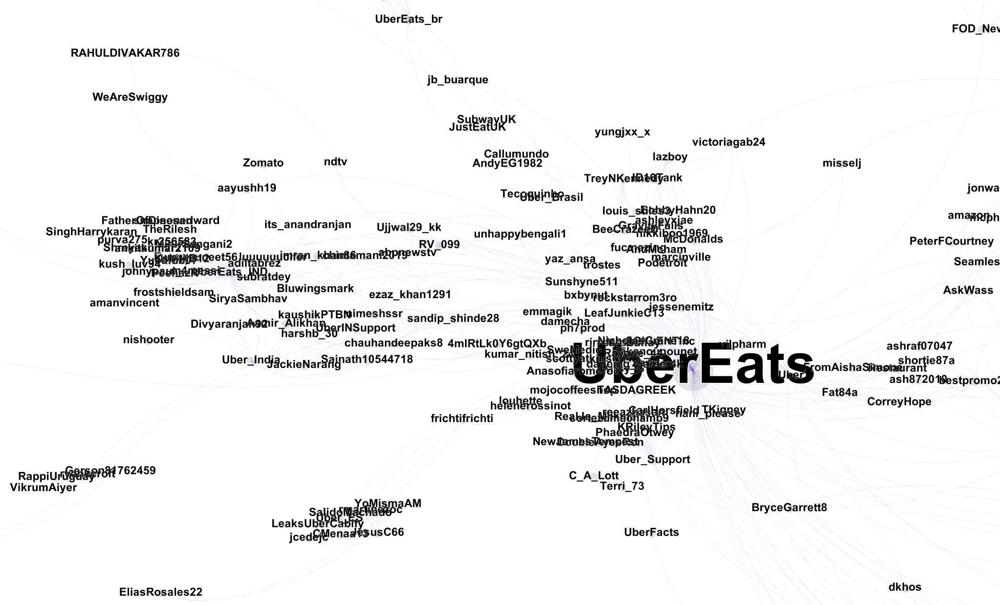

In [15]:
Image(filename='MentionUberEats.png', width=700, height=700)

QUESTION: Who are the most central users?

Aside from these visualizations, I looked closely at the raw data to see who the top ten tweeters were for each brand.

Top users for UberEats:
The top users for Uber Eats are seemingly mostly personal accounts. The top two are foreign accounts, referencing Uber Eats in other countries. Based off of the top ten usernames, I can tell that probably half of them are from other countries and are related to Uber(maybe Uber drivers twitter accounts), and the other few are random personal accounts, some of which are in the top ten for Grubhub and Doordash as well. 

Top Users for DoorDash:
The top user that mentions DoorDash is DoorDash_Help, which is the customer support twitter handle. There is another user CleanDropMobile that is a top tweeter for DoorDash and also for GrubHub. The others in the top ten look like a few personal accounts and small businesses. 

Top Users for Grubhub:
The top tweeter for Grubhub is grubhub_care, the other top ten don't seem too influencial, besides CleanDropMobile. This makes sense because Grubhub has the smallest cluster compared to the others. 

QUESTION: Who are the brige users?

As I mentioned above, one of the bridge users is CleanDropMobile, which is a foodies "keeping your restaurant clean" twitter account. Another brige user is shortie87a, who is a top ten user tweeting at UberEats and Grubhub. I looked up this account and found that this user tweets promo codes for these two brands. 

## Semantic Network Analysis 

In [16]:
import nltk
wn = nltk.WordNetLemmatizer()
ps = nltk.PorterStemmer()
import glob
import os
import re
import shutil
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
import csv
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()
import string
import itertools
import zipfile
import json
punctuation = string.punctuation
stopwordsset = set(stopwords.words("english"))
stopwordsset.add("'s")
#Removing urls
def removeURL(text):
    result = re.sub(r"http\S+", "", text)
    return result
#Extracting contextual words from a sentence
def tokenize(text):
    #lower case
    text = text.lower()
    #split into individual words
    words = word_tokenize(text)
    return words
def stem(tokenizedtext):
    rootwords = []
    for aword in tokenizedtext:
        aword = ps.stem(aword)
        rootwords.append(aword)
    return rootwords
def stopWords(tokenizedtext):
    goodwords = []
    for aword in tokenizedtext:
        if aword not in stopwordsset:
            goodwords.append(aword)
    return goodwords
def lemmatizer(tokenizedtext):
    lemmawords = []
    for aword in tokenizedtext:
        aword = wn.lemmatize(aword)
        lemmawords.append(aword)
    return lemmawords
def removePunctuation(tokenizedtext):
    nopunctwords = []
    for aword in tokenizedtext:
        if aword not in punctuation:
            nopunctwords.append(aword)
    cleanedwords = []
    for aword in nopunctwords:
        aword = aword.translate(str.maketrans('', '', string.punctuation))
        cleanedwords.append(aword)
    return cleanedwords

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/anlu0613/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/anlu0613/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/anlu0613/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [17]:
# new temporary directory for the following code
TMPDIR = 'tmp'

In [18]:
#path to save file 
if not os.path.exists(TMPDIR):
    os.makedirs(TMPDIR)

In [19]:
tweetzipfiles = glob.glob('*.zip')

In [20]:
for tweetzipfile in tweetzipfiles:
    with zipfile.ZipFile(tweetzipfile, "r") as f:
        print("Unzipping to tmp directory: %s" % tweetzipfile)
        f.extractall(TMPDIR)

Unzipping to tmp directory: DoorDash.zip
Unzipping to tmp directory: UberEats.zip
Unzipping to tmp directory: Grubhub.zip


In [21]:
#find unique words from text 
uniquewords = {}
count = 0

for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        count += 1
        if count % 1000 ==0:
            print(count)
        text = tweetjson['text']
        nourlstext = removeURL(text)
        tokenizedtext = tokenize(nourlstext)
        nostopwordstext = stopWords(tokenizedtext)
        lemmatizedtext = lemmatizer(nostopwordstext)
        nopuncttext = removePunctuation(lemmatizedtext)
        
        for aword in nopuncttext:
            if aword in uniquewords:
                uniquewords[aword]+= 1
            if aword not in uniquewords:
                uniquewords[aword]=1
        

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000


In [22]:
#include only unique words that appear more than 25 times
wordstoinclude = set()
wordcount = 0
for aword in uniquewords:
    if uniquewords[aword]> 25:
        wordcount += 1
        wordstoinclude.add(aword)

In [23]:
print(wordcount)

1144


In [24]:
#write csv file to import edgelist into; name headers
edgelist = open('semantic.edgelist.for.gephi.csv', 'w')
csvwriter = csv.writer(edgelist)

header = ['Source', 'Target', 'Type']
csvwriter.writerow(header)

print('Writing Edge List')

#loop through text to remove any words that aren't unique and repeated over 25 times
uniquewords = {}
count = 0

for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        count += 1
        if count % 1000 ==0:
            print(count)
        text = tweetjson['text']
        nourlstext = removeURL(text)
        tokenizedtext = tokenize(nourlstext)
        nostopwordstext = stopWords(tokenizedtext)
        lemmatizedtext = lemmatizer(nostopwordstext)
        nopuncttext = removePunctuation(lemmatizedtext)
        
        goodwords = []
        for aword in nopuncttext:
            if aword in wordstoinclude:
                goodwords.append(aword.replace(',',''))
        allcombos = itertools.combinations(goodwords, 2)
        for acombo in allcombos:
            row = []
            for anode in acombo:
                row.append(anode)
            row.append('Undirected')
            csvwriter.writerow(row)
edgelist.close()

Writing Edge List
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000


In [25]:
shutil.rmtree(TMPDIR)

## Visualization of the semantic words extracted from the data for each brand 

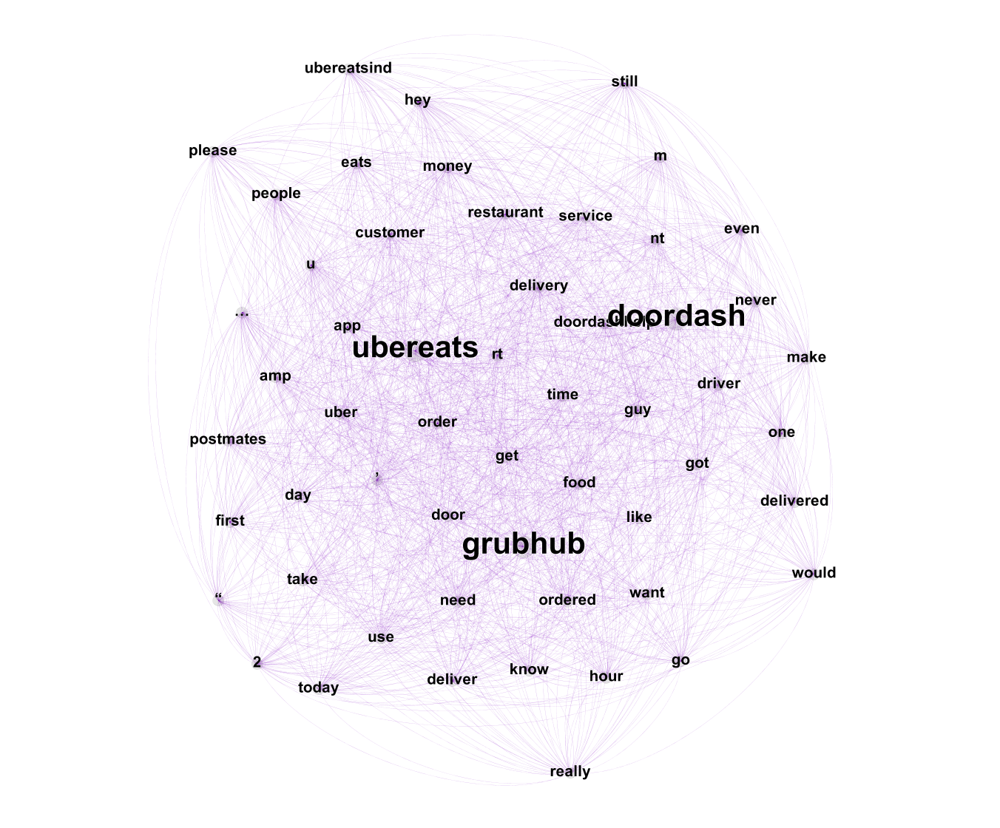

In [26]:
Image(filename='SemanticGephi.png', width=700, height=700)

The visualization above shows the semantic network analysis of which brands and words are most commonly associated with eachother. I chose to show a limited amount of words, in order to better visualize the connections. Based off of the results, you can see that majority of the most popular words are bridging words, that are closely associated with all three brands. 

## Semantic Analysis, English words only

In [27]:
TMPDIR = 'tmp'

In [28]:
#path to save file 
if not os.path.exists(TMPDIR):
    os.makedirs(TMPDIR)

In [29]:
tweetzipfiles = glob.glob('*.zip')

In [30]:
for tweetzipfile in tweetzipfiles:
    with zipfile.ZipFile(tweetzipfile, "r") as f:
        print("Unzipping to tmp directory: %s" % tweetzipfile)
        f.extractall(TMPDIR)

Unzipping to tmp directory: DoorDash.zip
Unzipping to tmp directory: UberEats.zip
Unzipping to tmp directory: Grubhub.zip


Similar to the code in the previous analysis, the for loop below also includes a iso_language filter on the text for english words only. 

In [31]:
uniquewords = {}
count = 0

for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        count += 1
        if count % 1000 ==0:
            print(count)
            
        text = tweetjson['text']
        language = tweetjson['metadata']['iso_language_code']
        if language == 'en':
        
            nourlstext = removeURL(text)
            tokenizedtext = tokenize(nourlstext)
            nostopwordstext = stopWords(tokenizedtext)
            lemmatizedtext = lemmatizer(nostopwordstext)
            nopuncttext = removePunctuation(lemmatizedtext)
        
            for aword in nopuncttext:
                if aword in uniquewords:
                    uniquewords[aword]+= 1
                if aword not in uniquewords:
                    uniquewords[aword]=1

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000


In [32]:
wordstoinclude = set()
wordcount = 0
for aword in uniquewords:
    if uniquewords[aword]> 20:
        wordcount += 1
        wordstoinclude.add(aword)

In [33]:
print(wordcount)

1049


In [34]:
#write csv file for edgelist 
edgelist = open('english.semantic.edgelist.for.gephi.csv', 'w')
csvwriter = csv.writer(edgelist)

header = ['Source', 'Target', 'Type']
csvwriter.writerow(header)

print('Writing Edge List')

uniquewords = {}
count = 0

#remove all words that are not english 
for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        count += 1
        if count % 1000 ==0:
            print(count)
        text = tweetjson['text']
        nourlstext = removeURL(text)
        tokenizedtext = tokenize(nourlstext)
        nostopwordstext = stopWords(tokenizedtext)
        lemmatizedtext = lemmatizer(nostopwordstext)
        nopuncttext = removePunctuation(lemmatizedtext)
        
        goodwords = []
        for aword in nopuncttext:
            if aword in wordstoinclude:
                goodwords.append(aword.replace(',',''))
        allcombos = itertools.combinations(goodwords, 2)
        for acombo in allcombos:
            row = []
            for anode in acombo:
                row.append(anode)
            row.append('Undirected')
            csvwriter.writerow(row)
edgelist.close()

Writing Edge List
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000


In [35]:
shutil.rmtree(TMPDIR)

## Visualization of a Semantic Analysis with top English words used in the tweets 

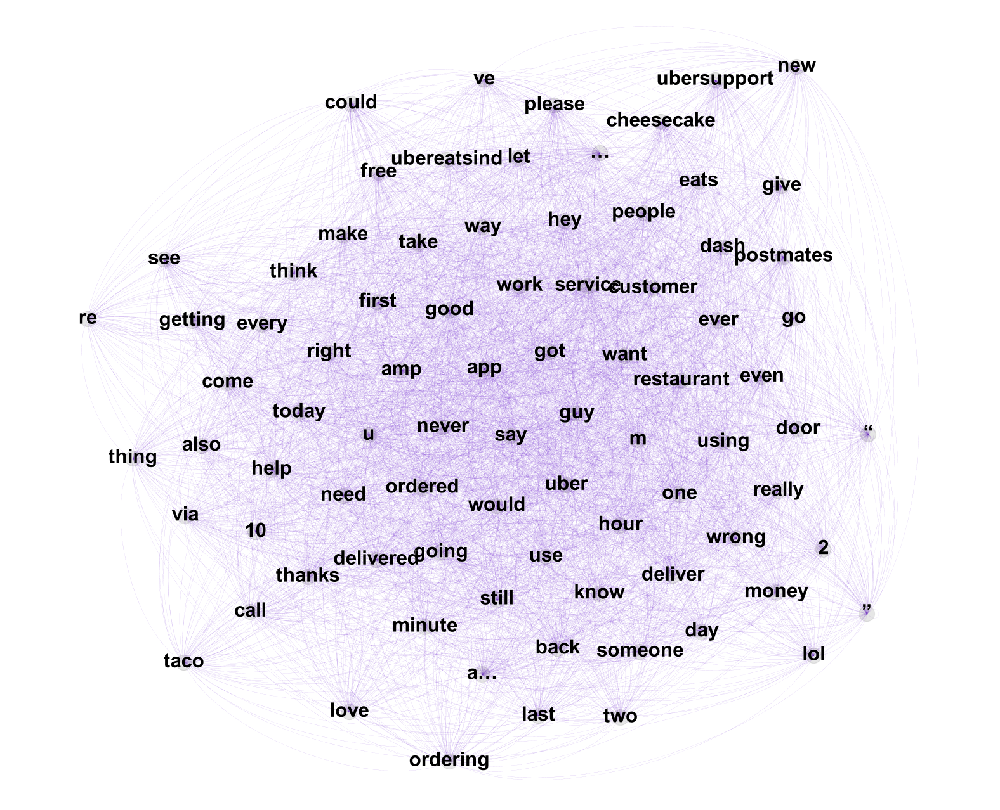

In [36]:
Image(filename='EnglishGephi.png', width=700, height=700)

The above visualization is similar to the previous semantic visualization, however, this one is filtered to only show english words. There aren't any major differences in the visual, but it is a helpful filter to have if we were to be analzying brands with a stronger international presence. 

## Sentiment Analysis 

In [37]:
from textblob import TextBlob

In [38]:
TMPDIR = 'tmp'

In [39]:
#path to save file 
if not os.path.exists(TMPDIR):
    os.makedirs(TMPDIR)

In [40]:
tweetzipfiles = glob.glob('*.zip')

In [41]:
for tweetzipfile in tweetzipfiles:
    with zipfile.ZipFile(tweetzipfile, "r") as f:
        print("Unzipping to tmp directory: %s" % tweetzipfile)
        f.extractall(TMPDIR)

Unzipping to tmp directory: DoorDash.zip
Unzipping to tmp directory: UberEats.zip
Unzipping to tmp directory: Grubhub.zip


In [42]:
# This For loop filters tweets with sentiment ratings that were above 0.
uniquewords = {}
count = 0

for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        count += 1
        if count % 1000 ==0:
            print(count)
            
        text = tweetjson['text']
        sentimentscore = TextBlob(text)
        score = sentimentscore.sentiment.polarity
        print(score)
        
        if score > 0:
            nourlstext = removeURL(text)
            tokenizedtext = tokenize(nourlstext)
            nostopwordstext = stopWords(tokenizedtext)
            lemmatizedtext = lemmatizer(nostopwordstext)
            nopuncttext = removePunctuation(lemmatizedtext)
        
            for aword in nopuncttext:
                if aword in uniquewords:
                    uniquewords[aword]+= 1
                if aword not in uniquewords:
                    uniquewords[aword]=1

0.0
0.0
-0.2
0.0
0.0
0.8
0.10833333333333334
-0.6
0.0
0.0
0.25
0.0
-0.4
-0.3
-0.21666666666666667
0.0
0.14285714285714285
0.0
0.0
0.0
0.3333333333333333
0.625
0.0
0.0
0.0
-0.35
-0.5
0.25
0.7000000000000001
0.0
-0.5
0.0
0.0
0.5833333333333334
0.0
0.0
0.0
0.13636363636363635
0.0
0.7453125
-0.5
0.0
0.0
0.14285714285714285
0.0
0.0
0.0
0.09999999999999998
-1.0
0.0
0.0
0.0
0.0
0.175
0.0
0.0
0.0
-0.2
0.1
0.35714285714285715
0.0
0.0
-0.4
0.0
0.0
0.0
0.0
0.0
0.39999999999999997
0.0
0.0
0.0
0.0
0.1
0.0
0.0
-0.39999999999999997
0.25
-0.0625
0.2
0.0
0.0
0.0
0.5
0.0
0.0
0.0
0.1
0.0
-0.2
0.0
-0.25
0.14285714285714285
-0.05416666666666667
0.2
0.0
0.6
0.4
0.0
0.0
0.7
0.0
0.0
0.0
0.1
0.0
0.25
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.0
-0.3
0.0
0.0
0.2787337662337662
0.0
0.0
0.0
0.15
0.0
-0.625
0.0
0.0
0.0
-0.1
0.0
0.0
-0.1277777777777778
0.0
0.0
-0.6
0.75
0.0
-0.19444444444444448
0.0
0.15000000000000002
0.0
0.0
-0.6499999999999999
0.0
0.0
0.0
0.25
0.3125
0.2102272727272727
1.0
0.0
-0.4
0.6
0.0
0.0
0.0
0.2
0.0
0.

0.0
0.0
1.0
-0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.2
-0.04285714285714285
0.13636363636363635
-0.25
-0.46875
0.0
0.0
0.1
-0.25
0.13636363636363635
0.0
0.0
0.1
0.0
0.0
0.0
0.0
0.0
0.43333333333333335
-0.15555555555555559
0.0
0.0
0.0
-0.15
0.13636363636363635
-0.40625
0.0
0.0
0.0
-0.03571428571428571
0.0
-0.5
0.0
0.0
0.0
0.1
0.875
0.0
0.0
0.26212121212121214
-1.0
-0.2
0.0
0.0
-0.16666666666666666
0.0
0.0
0.5
-0.21875
0.0
0.5
-0.5
0.18333333333333335
-0.25
0.4
0.0
0.0
0.0
0.0
0.1
0.125
0.0
0.0
0.0
0.0
0.0
-0.25833333333333336
0.0
0.14285714285714285
0.0
0.19999999999999998
0.041666666666666664
0.1
0.0
0.0
0.5
0.15000000000000002
0.9
0.0
0.0
0.0
0.0
0.0
0.33749999999999997
-0.39666666666666667
0.0
0.0
0.0
-0.5
0.0
0.1
0.0
0.4
0.0
0.075
0.0
0.018750000000000003
0.0
0.0
0.18
0.15000000000000002
0.0
0.0
0.0
0.0
0.8
0.0
0.0
-0.2
-0.2
0.0
0.0
0.0
0.0
5.551115123125783e-17
0.0
0.4
0.0
0.21428571428571427
-0.5
0.15
0.1
0.0
0.0
0.4166666666666667
0.14285714285714285
0.0
-0.6354166666666666
0.0
-0.349

0.0
-0.8
0.0
-0.2
-0.16666666666666666
0.0
0.325
0.0
0.7
-0.38888888888888884
0.0
0.0
-0.5
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.19285714285714284
0.0
0.6
0.0
0.0
0.175
-0.6
0.0
-0.1
-0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.2
0.0
0.0
0.0
0.0
0.0
-0.175
-0.033333333333333326
0.475
0.0
-0.3
0.15000000000000002
0.0
0.1
0.5
0.0
0.18333333333333335
0.0
0.0
0.4
-0.20277777777777778
0.0
-0.31666666666666665
0.0
0.0
-0.75
0.475
0.3197727272727273
0.0
-0.2
0.04999999999999999
0.0
-0.1777777777777778
0.0
0.0
0.17916666666666667
0.0
0.0
0.0
0.0
0.21428571428571427
-0.5
0.0
0.0
0.0
-0.5
0.21875
0.0
0.8
-0.15690104166666657
0.15625
0.0
0.0
0.0
0.0
0.0
0.0
0.1
0.0
-0.2
0.5208333333333334
-0.0625
0.5625
0.0
0.4166666666666667
0.6
-0.23333333333333328
0.0
0.25
0.6
-0.5
0.5
0.0
0.0
0.2722222222222222
0.0
-0.125
0.625
0.525
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.2
0.125
0.0
-0.1
-0.3166666666666667
0.0
0.0
-0.5
0.0
0.0
0.0
-1.0
0.5
0.0
-0.2
0.0
0.0
0.0
0.0
-0.2
0.0
-0.19444444444444448
0.0
0.0
0.0
0.3125
0.1
-0.3
0.0
0.

0.1
0.0
0.0
0.4000000000000001
0.625
0.0
0.4
0.0
-0.78125
0.35
0.0
0.0
0.14814814814814814
0.1
-0.5
-0.2
0.027777777777777787
0.0
0.125
0.0
0.04999999999999999
0.4
0.0
0.325
0.0
0.09285714285714285
0.0
0.0
-0.3125
0.0
0.0
-0.2
0.0
-0.2
-0.17500000000000002
-0.3111111111111111
0.1
0.5
0.0
0.0
0.0
0.0
-0.4666666666666667
0.1
0.0
0.0
0.65
-0.2
0.15000000000000002
0.19285714285714284
-0.1
0.78
0.2
0.13636363636363635
0.0
0.0
0.0
0.0
-0.7
-0.26666666666666666
0.0
-0.5848307291666668
0.0
1.0
0.15000000000000002
0.0
0.0
0.0
0.2681818181818182
0.0
0.1
0.0
-0.25
0.375
-1.0
-0.2
0.15000000000000002
-0.20000000000000004
-0.3499999999999999
0.0
0.8
0.0
0.0
-0.3
0.0
0.0
0.7
0.0
0.0
0.0
0.0
0.03148148148148147
0.0
0.1
0.0
0.0
-0.15
-0.8
0.0
-0.15
0.0
0.4
0.0
-0.4
0.07142857142857142
0.0
0.0
0.5
0.5
0.0
0.0
0.0
-0.09999999999999998
-0.4
0.75
0.0
-0.2
0.0
-0.4
0.0
0.19318181818181818
0.19285714285714284
0.0
-0.3
0.15000000000000002
0.0
-0.6
0.125
0.6
-0.75
0.0
0.0
-0.6
0.0
-0.390625
0.0
0.0
-0.3999999

0.0
-0.1
0.0
0.49
0.0
-0.425
-0.06666666666666665
-0.5
0.0
0.5833333333333334
0.0
0.0
0.7812500000000001
0.0
0.1
0.0
0.0
0.0
0.1
-0.1875
-0.4
0.125
-0.1
-0.13333333333333333
0.0
0.30833333333333335
0.0
0.0
-0.2
0.0
0.6
-0.1
0.0
0.15625
0.5833333333333334
0.0
0.1
0.0
0.0
0.0
0.22023809523809523
0.0
0.24270833333333333
-0.2
-0.16666666666666666
0.0
0.0
0.0
-0.00416666666666668
-0.4375
-0.625
0.0
0.4
0.0
0.625
0.4
-0.5
0.5
0.0
0.2
0.0
0.2
0.0
0.0
0.0
0.0
1.0
0.0
0.0
0.6
0.0
0.0
0.0
0.0
0.0
0.2924107142857143
-0.2
0.0
0.0
0.0
-0.4
-0.2
0.0
0.0
0.0
0.0
0.18333333333333335
0.0
0.19285714285714284
0.0
0.0
0.0
0.625
0.0
0.0
0.0
0.25
0.0
-0.5
-0.26975446428571426
0.5
0.0
-0.5
0.0
0.0
0.0
0.0
-0.25
0.0
0.1
0.75
0.25
0.3
0.0
0.0
-0.08333333333333333
0.5
0.0
0.0
0.0
0.0
-1.0
0.0
-0.4
0.0
0.4
-1.0
1.0
-0.6
0.0
0.0
0.875
0.24270833333333333
0.0
0.0
0.0
0.875
-0.2625
0.0
0.3
0.0
0.0
0.18333333333333335
0.0
0.0
0.15000000000000002
0.0
0.1
0.0
0.0
0.0
0.0
0.0
-0.3
0.1
0.0
-0.4222222222222221
0.0
0.0
0.

0.0
0.0
0.0
0.3
0.0
0.0
0.0
0.4375
0.0
0.1
0.0
-0.4
-0.6
0.19999999999999998
0.15
0.35
0.8
0.375
0.0
0.21666666666666667
0.0
-0.15000000000000002
-0.5
0.1
0.0
0.5
0.0
-0.45
0.0
0.05
0.0
-1.0
0.0
0.0
0.0
0.1
0.0
0.2
-0.11666666666666665
0.1
0.13333333333333333
0.0
0.1
0.0
0.125
0.0
0.1
-0.4
0.0
0.0
0.0
0.2833333333333333
0.0
0.3111111111111111
-0.4
0.0
0.0
0.2555555555555556
0.0
0.5
0.6
0.5
0.0
0.125
1.0
0.0
0.0
0.6
-0.1388888888888889
0.0
0.4
0.5
-0.26666666666666666
0.0
0.0
-0.2
0.0
0.6000000000000001
-0.5
-0.5
0.0
0.0
0.3
0.0
0.0
0.0
0.1625
0.0
0.0
-1.0
-0.2
0.0
0.0
-0.23333333333333328
0.6666666666666666
0.0
0.1
0.0
0.0
0.25
0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.1
-0.5
0.13636363636363635
0.13636363636363635
0.0
0.0
0.13636363636363635
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.1
0.0
0.0
0.0
0.0
0.0
-0.4444444444444445
-0.78828125
0.1125
0.2888888888888889
0.0
-0.09999999999999998
0.8
0.1
0.0
0.0
0.25
0.0
0.3020833333333333
0.0
0.0
0.0
-0.125
0.0
-0.75
-0.133333333333333

0.18333333333333335
0.0
8000
0.0
0.07301587301587299
0.5666666666666667
0.0
0.2833333333333334
0.1
0.0
-0.10416666666666667
-0.1
0.5
0.0
0.8
0.1
0.0
0.1
0.0
-0.2
0.0
-0.25
0.0
0.0
0.0
0.0
0.0
0.28571428571428575
0.0
0.2
0.0
0.1875
0.0
0.0
-0.30000000000000004
-0.6
0.0
0.0
0.6
0.0
0.35
-0.15555555555555559
0.0
0.31666666666666665
0.15000000000000002
0.0
-0.05
0.0
0.51875
0.0
0.0
0.0
0.0
-0.41111111111111104
-0.05
0.0
0.0
0.0
0.4
-0.35
-0.07142857142857144
0.0
0.0
-0.24999999999999992
-0.26666666666666666
0.0
0.41666666666666663
0.005681818181818177
0.0
0.0
0.0
0.5833333333333334
0.0
0.0
0.3
0.4
-0.08333333333333333
0.0
0.0
-0.3
0.0
0.0
0.0
-0.4
0.0
-0.4
-0.2
0.0
0.0
0.0
-0.5
0.42857142857142855
0.4
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.3125
0.0
-0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.5
-0.2
0.0
0.7333333333333333
0.9375
-0.5
0.0
0.0
-0.5
0.0
0.0
0.25
0.0
0.0
0.0
-0.13333333333333333
-0.3
0.0
-0.38750000000000007
0.0
0.5833333333333334
0.0
0.2
0.0
0.5
-0.2
0.0
0.1
-0.20468750000000002
0.0
0.0
0.

0.0
0.0
0.25
0.0
0.7
0.0
0.75
0.8
0.0
0.0
0.0
0.0
0.46875
0.0
0.0
-0.2
-0.5
0.0
-0.15555555555555559
0.18333333333333335
0.0
-0.04999999999999999
0.0
0.3125
0.4
0.16
0.0
0.11249999999999999
-0.25
0.0
0.4
0.05833333333333335
0.0
-0.6
0.11666666666666665
0.0
0.0
0.0
0.0
0.45
0.0
0.0
0.0
0.0
-0.3
0.0
0.11742424242424243
0.0
0.0
0.0
-0.007142857142857145
-0.1777777777777778
0.0
-0.30000000000000004
0.0
0.0
0.0
0.0
0.6
0.18214285714285716
0.0
0.0
0.0
0.0
0.0
0.0
0.13636363636363635
0.0
0.0
0.0
0.0
0.5
0.0
0.0
0.25
0.0
0.0
0.4
0.0
0.0
0.0
0.0
-1.0
0.0
0.0
0.0
0.25
0.0
0.75
0.0
0.0
0.25
0.5
0.0
0.0
0.015625
0.0
0.1
0.4
-0.07500000000000001
0.0
0.0
0.6
-0.4375
0.0
0.0
0.0
0.1
0.0
0.6
0.0
0.0
0.0
0.0
0.2
-0.19999999999999998
0.0
0.0
0.0
0.0
0.0
0.0
0.55
0.0
0.0
0.1
-0.05
0.0
0.25
0.1
-0.2
0.0
0.0
-1.0
0.0
0.0
0.0
-0.25
0.0
0.0
0.0
0.01111111111111109
0.0
0.25
0.0
0.0
0.0
0.24270833333333333
-0.1
0.0
-0.25
0.0
-1.0
0.0
0.0
0.4
0.625
0.5
0.0
0.25
0.0
0.0
0.375
0.24444444444444444
-0.0714285714285

0.0
0.0
0.0
-0.4125
-0.09047619047619049
0.0
0.23750000000000002
0.0
0.20833333333333331
0.5249999999999999
0.0
0.0
0.35
0.0
-0.5
-0.7999999999999999
0.39285714285714285
0.0
0.13333333333333333
0.0
0.45000000000000007
0.0
0.0
-0.6
0.16
0.0
0.0
0.0
0.7666666666666666
0.0
0.0
0.1
-0.5
0.0
0.0
0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.4
0.6
-0.4
0.0
0.0
-0.5
0.0
-1.0
0.3
-0.75
0.4285714285714286
0.0
0.0
0.5
-0.14285714285714285
0.5
0.0
0.6
0.0
-0.6
0.0
0.0
0.43333333333333335
0.0
-0.25
0.0
0.0
0.0
0.0
0.26212121212121214
-0.23055555555555554
0.19318181818181818
0.0
0.0
-0.25
0.35
0.0
-0.3333333333333333
0.0
0.425
0.0
0.0
0.0
0.6
0.25
0.0
0.0
0.2
0.0
0.0
0.2857142857142857
0.0
-0.2
-0.4
-0.4
0.0
0.325
0.08333333333333333
0.0
0.0
0.4000000000000001
0.0
0.0
0.0
-1.0
0.0
0.13636363636363635
0.0
0.8
0.0
-0.6
0.0
0.0
0.0
-0.1875
-0.12121212121212122
0.0
-0.3
0.0
0.0
0.0
0.0
0.25
0.0
1.0
0.0
0.0
0.0
0.0
0.0
0.3888888888888889
0.0
0.0
0.1
0.016666666666666635
0.15000000000000002
0.0
-0.6
-0.

0.0
0.13333333333333333
0.5
0.0
0.6
0.0
0.0
0.15000000000000002
0.0
0.0
0.125
12000
0.0
0.0
0.0
-0.08333333333333333
0.0
0.0
0.0
-0.25
0.0
0.13636363636363635
0.0
0.0
0.0
0.0
0.2
0.0
0.0
-0.4
0.5833333333333334
0.625
0.3
-0.6
0.0
0.0
-0.5
0.0
0.0
0.0
0.25
0.0
-0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.1
0.06818181818181818
0.7
0.0
0.0
1.0
0.0
-0.6875
0.0
0.0
0.0
-0.003409090909090917
0.0
0.0
0.0
0.0
0.7
0.0
0.0
0.0
0.2
-0.3
0.0
0.0
0.14285714285714285
-0.4
-0.26666666666666666
0.0
0.625
-0.1
0.0875
0.0
-0.16666666666666666
0.0
-0.21666666666666667
0.0
0.5
-0.2
0.6666666666666666
0.5
0.1
-0.3625
0.0
0.0
0.1
0.625
0.0
-0.55
-0.05
0.0
-0.1
0.0
-0.6
0.0
0.0
0.6666666666666666
0.0
0.2857142857142857
-0.3333333333333333
0.0
0.0
0.0
0.0
0.0
0.0
-0.5
0.0
0.1
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.07500000000000001
0.0
0.0
0.25
0.0
0.5333333333333333
0.0
0.0
0.5
0.0
0.0
0.0
-0.3
0.13636363636363635
0.0
0.0
0.0
0.0
0.3
0.0
0.0
0.0
0.0
0.0
0.25
0.1
0.0
0.0
0.0
0.2080000000000

0.0
0.0
0.14285714285714285
0.43333333333333335
0.0
0.0
0.8
0.0
-0.16666666666666666
0.0
-0.175
0.0
0.0
0.0
0.0
0.625
0.0
0.2
-0.2
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.55
0.0
0.0
-0.25
0.1
0.48214285714285715
0.0
0.0
0.0
0.0
0.5
0.0
0.0
0.08750000000000002
0.2987723214285714
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.2
0.0
0.2
0.0
0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.3
0.0
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.5
0.0
0.15000000000000002
0.0
0.007272727272727264
0.0
0.1
0.3333333333333333
0.0
0.0
0.0
0.0
-0.2
-0.2625
0.0
0.0
0.4
-0.25
0.0
0.0
-0.2
0.0
0.8
0.0
0.1
0.0
0.3
0.35
0.0
0.0
0.0
0.0
0.1
0.0
0.30000000000000004
0.0
0.0
0.0
0.4
-0.15555555555555559
0.0
0.0
0.0
-0.15
0.0
0.0
0.0
0.4
0.0
0.375
0.0
0.5833333333333334
0.0
0.1
0.0
0.0
0.5
0.0
-0.5
0.0
0.0
0.0
1.0
-0.2
-0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.6
0.07499999999999998
-0.125
0.0
0.16
0.0
-0.35
0.0
-0.3
0.0
0.13636363636363635
0.0
0.0
0.0
0.75
0.0
0.0
0.0
-0.06666666666666665
-0.25
0.0
0.14545454545454548
0.6
-0.0625
0.225
0.0
0.0
0.18333333333333335


0.0
0.0
0.43333333333333335
0.0
0.0
0.0
0.0
0.25
0.0
0.16
0.0
0.15000000000000002
-0.17121212121212123
0.0
0.625
0.1
0.1
-0.5
0.4
0.5
0.25
0.0
0.0
0.4
0.41666666666666663
0.0
0.0
0.0
0.0
-0.35
0.0
0.0
0.30000000000000004
0.5
0.0
-1.0
0.0
-0.11875
0.0
0.26666666666666666
0.0
0.0
0.0
-0.3
0.0
0.0
-0.4
0.0
0.4
0.0
0.0
-0.5
0.1
0.0
0.0
0.0
0.0
-0.2
0.25
0.0
0.15000000000000002
0.0
0.0
-0.09999999999999998
0.0
-0.08181818181818182
0.0
0.4
0.0
0.0
0.0
0.5
-0.1
0.0
0.0
0.0
0.0
0.6666666666666666
0.0
1.0
-0.5
0.0
-0.4
0.0
0.0
0.0
0.0
0.0
0.018181818181818174
0.0
0.0
0.0
-0.2
0.0
0.625
-0.4666666666666667
0.125
-0.1777777777777778
0.41666666666666663
0.0
0.0
0.0
0.0
0.25
0.054166666666666696
0.0
0.0
0.0
-0.35
-0.4
0.0
0.0
-0.2277777777777778
0.5
0.0
-0.75
-0.08333333333333333
0.0
-0.2625
0.0
0.0
0.0
0.1
0.1
0.0
0.0
-0.75
0.0
0.005681818181818177
0.08333333333333333
-0.04583333333333334
0.2
-0.08333333333333333
0.0
0.0
-0.1
0.0
-0.325
-0.625
0.0
0.0
-0.6999999999999998
0.0
0.0
0.0
0.5
0.1
0.35
0

0.0
0.45
0.04999999999999999
0.0
-0.09629629629629631
0.0
0.5833333333333334
0.0
0.0
0.0
0.0
0.0
0.24270833333333333
0.0
0.6
0.0
-0.15
0.6
-0.09166666666666665
0.0
-0.08518518518518518
-0.2
-0.5
0.0
0.0
-0.4
0.1
-0.05
0.04999999999999999
0.125
0.1
0.0
0.0
-0.525
0.0
0.0
-0.2
0.0
-0.15
-0.5
0.0
0.625
0.0
-0.2
-1.0
0.0
0.0
0.0
0.225
0.0
0.0
0.0
0.0
0.0
-0.25
0.0
0.06507936507936506
0.0
0.375
0.0
0.0
0.17777777777777778
0.0
0.0
0.0
0.21428571428571427
0.5
0.0
0.0
0.35714285714285715
-0.35
0.1
0.1
0.15000000000000002
0.0
0.0
0.0
0.30000000000000004
0.0
-0.5
0.5625
0.0
0.23750000000000002
-0.2
-1.0
0.325
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.2
0.0
-0.5
-0.6
0.0
0.0
0.0
0.0
0.0
0.2556818181818182
0.0
0.0
0.0
-1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.6
0.0
-0.4
0.0
0.0
0.0
-0.2
0.0
0.0
-0.15
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.275
-0.19444444444444448
0.6
0.4208333333333334
0.1
0.3333333333333333
-0.06666666666666667
-0.2
0.0
0.0
0.0
0.125
0.25
0.0
0.0
0.0
0.0
-0.3
-0.5
0.0
0.0
0.0
0.0
0.6
0

0.0
0.0
0.0
0.0
0.0
-0.75
0.0
0.0
-0.2
0.0
0.0
0.0
0.0
0.0
0.125
0.8
-0.78125
0.0
0.0
0.0
0.3
0.0
0.1
0.21428571428571427
0.0
0.0
0.0
-0.08333333333333333
0.0
0.1
0.0
0.0
0.0
0.0
1.0
-0.40625
0.0
0.0
0.8991815476190476
0.0
0.0
0.25
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.390625
0.0
0.0
0.0
0.0
-0.0875
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.5
-0.2
0.0
0.0
0.0
-0.125
0.0
0.0
-0.2
-0.15555555555555559
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.4
0.0
0.0
-0.07999999999999999
0.09166666666666666
0.0
0.0
0.0
-0.6
0.0
0.0
-0.4
0.0
0.0
-0.5
-0.3
0.0
0.0
0.0
-0.04999999999999996
0.17777777777777778
0.0
0.14285714285714285
0.0
0.0
0.0
0.0
0.0
0.15
0.13636363636363635
0.0
0.5
0.0
0.0
0.0
0.425
0.0
0.1
0.0
0.0
0.3833333333333333
0.0
0.0
0.0
0.0
0.0
0.3125
0.625
0.125
0.4
0.19285714285714284
0.0
0.0
0.0
0.8
0.0
0.0
0.0
0.0
0.2
0.0
0.0
0.0
0.5
-0.024999999999999994
0.0
0.0
-1.0
0.0
0.35
-0.5
0.0
0.08333333333333333
0.08333333333333333
0.0
0.4
0.4
0.78125
0.0
0.0
0.0
0.5
0.5833333333333334
0.0
-0.25
0.0
0.1
0.2
0.8
0.

0.0
0.14285714285714285
0.0
0.0
0.0
0.007142857142857131
-0.1875
0.4375
0.0
-0.03518518518518519
-0.80078125
0.0
-0.3
0.0
0.2
0.2857142857142857
0.0
0.0
0.24270833333333333
0.625
0.0
-0.2142857142857143
0.0
0.0
0.0
-0.2
0.75
0.6000000000000001
0.25
0.0
-0.6999999999999998
0.0
0.0
-0.065
-0.125
0.0
0.0
0.1
0.24285714285714285
-0.15
0.0
0.0
0.0
-1.0
0.0
0.0
0.0
0.8
0.0
-0.225
0.0062500000000000056
0.0
0.43333333333333335
0.2
0.0
0.0
0.0
0.12777777777777777
0.0
0.0
0.1
-0.175
0.0
0.0
0.0
0.1
0.0
0.08750000000000002
0.0
0.1875
0.25
0.3333333333333333
0.08928571428571427
0.0
0.0
0.1
0.0
0.35
0.0
0.0
0.0
0.0
-0.2
0.2625
0.0
0.0
0.0
0.0
0.0
-0.125
0.625
0.3
0.125
0.0
0.0
0.0
0.0
0.0
0.0
0.26212121212121214
0.23750000000000002
0.0
0.0
0.0
0.13636363636363635
0.0
0.3571428571428571
0.0
0.0
0.1125
-0.5
1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.2
-0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.26212121212121214
0.25
0.0
0.0
0.75
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.0
0.0
-0.0071428571428571

0.4
0.0
0.0
0.625
0.0
0.0
0.0
1.0
0.0
-0.6
0.05909090909090909
0.0
0.04999999999999999
0.0
0.0
0.0
0.0
0.0
0.0
-0.2
0.0
-0.2
0.6
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.1
0.375
0.0
0.26785714285714285
0.0
-0.16666666666666666
0.0
0.0
0.0
0.0
0.0
0.0
0.2
0.0
0.0
0.0
0.0
0.21428571428571427
0.2
0.0
0.1
0.0
-0.375
0.2857142857142857
0.0
-0.2
0.5
0.0
0.25
0.0
0.0
0.6
0.0
0.10000000000000002
0.0
0.0
0.5
-0.2
0.0
0.08333333333333333
0.0
0.0
0.0
0.0
0.0
0.0
-1.0
0.5833333333333334
0.11607142857142858
-0.4
-0.5
0.037500000000000006
0.0
0.0
-0.5
0.0
0.4
-0.44999999999999996
0.0
0.0
0.0
0.03148148148148147
0.1
0.0
-0.033333333333333326
0.625
-0.3
0.625
0.5
0.0
0.0
0.0
-1.0
0.15000000000000002
0.0
-0.05
0.4
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.17666666666666667
-0.3
0.5
0.1
0.25
0.0
0.0
0.0
0.0
0.0
-0.15555555555555559
0.0
-0.2
0.3
0.125
0.0
0.0
0.0
0.0
0.0
0.24285714285714285
0.0
0.21428571428571427
0.55
0.5
0.0
0.0
0.2
1.0
0.0
0.0
0.1875
0.325
-0.25714285714285706
0.19285714285714284
0.0
0.0
0.0
0.5
0.0
-0.278

0.0
0.0
0.14285714285714285
0.0
0.0
0.0
0.0
-0.5
0.0
0.0
0.0
0.0
0.25
0.0
-0.04999999999999996
0.48750000000000004
0.26212121212121214
-0.25
0.15
-0.6999999999999998
0.0
1.0
0.0
0.10000000000000002
-0.5
0.0
0.0
-0.5
0.35
0.0
0.0
0.0
0.5
0.1875
0.0
0.0
0.0
-0.4333333333333333
0.0
-0.125
0.0
0.0
0.0
0.0
0.25
0.0
0.0
0.15000000000000002
0.8
0.2
0.0
0.0
0.0
0.8
0.0
-0.7999999999999999
0.0
0.19285714285714284
0.9
0.0
0.13636363636363635
0.0
-0.14999999999999997
0.0
0.6
0.0
-1.0
0.13636363636363635
0.0
-0.0625
-0.2
1.0
0.3125
0.0
0.0
0.3333333333333333
0.0
0.5
0.0
0.2
-0.033333333333333326
0.0
0.625
0.2
0.0
0.13636363636363635
0.0
-0.5
0.05
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.16666666666666666
-0.09765625
0.0
-0.15833333333333333
0.8
0.0
0.0
0.0
0.0
0.0
-0.2
0.0
0.0
0.0
0.0
0.0
0.0
-0.5
-0.07777777777777779
0.0
-0.3
0.0
-0.45
0.0
0.0
0.0
0.0
0.0
0.25
0.0
0.0
0.0
-0.1
0.0
0.0
-0.33749999999999997
0.0
0.0
0.5
0.0
0.0
0.0
0.20833333333333331
-0.325
-0.125
0.0
0.0
0.0
0.0
-0.06666666666666667
0.5
-0.

0.0
0.0
0.10000000000000002
0.8
0.0
0.25
0.0
-0.5
-0.2
-0.8
0.016666666666666663
0.1
0.0
0.1
-1.0
0.2
0.0
-0.13181818181818183
0.0
-0.6
0.1
0.0
0.0
0.875
0.0
1.0
0.0
0.0
-0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.16666666666666666
0.0
0.1
-0.19444444444444448
0.0
0.0
0.19999999999999998
0.31666666666666665
0.5
0.0
0.07500000000000001
0.0
0.0
1.0
0.0
-1.0
0.0
0.0
0.1
-0.5
0.0
-0.4
0.0
0.625
0.0
0.1
-0.025
0.0
0.1
0.0
0.14285714285714285
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.2
0.46666666666666673
0.1777777777777778
0.0
0.0
0.0
-0.6
-0.6
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-0.19444444444444448
0.0
0.35
0.125
0.9
-1.0
0.0
0.0
0.0
-0.109375
0.5
0.13333333333333333
0.0
0.0
0.0
0.0
0.25
0.0
0.0
0.0
0.375
0.0
-0.16666666666666666
-0.40625
0.0
0.2142857142857143
0.0
0.2
-0.5
0.0
0.35000000000000003
0.1625
0.21875
0.0
-0.2
0.0
0.0
0.05
0.0
0.18333333333333335
0.6
0.0
0.0
-0.5625
1.0
-0.3
0.18333333333333335
0.0
0.0
0.0
0.0
0.2
0.0
0.4
0.0
-0.5
0.16666666666666666
0.0
0.0
0.0
-0.699999999999999

0.0
-0.5
0.0
0.0
0.8
0.0
0.6666666666666666
0.05952380952380952
0.625
0.1
-1.0
0.0
0.1
0.0
-0.2
0.4
0.1
-0.4
0.0
0.1
0.0
0.0
0.06818181818181818
-0.5
-0.2
0.1
-0.5
0.0
0.5
-0.15555555555555559
0.0
0.0
0.0
0.0
0.0
-0.15
0.0
0.29545454545454547
0.0
0.5
0.0
0.0
0.1
0.0
0.0
0.0
0.2
0.0
0.0
0.0
0.0
-0.2
0.0
-0.16666666666666666
0.15
-0.5
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.25
0.0
-0.15
0.0
0.0
0.0
0.0
0.0
0.0
-0.5
0.0
-0.05
0.3333333333333333
0.0
0.0
0.0
0.26666666666666666
0.0
1.0
0.0
0.65
0.0
0.0
0.0
0.0
-0.2
0.0
0.0
0.8
0.0
0.4
0.34
-0.05555555555555555
0.0
0.8
0.0
0.0
0.0
0.13333333333333333
0.26785714285714285
24000
-0.3
0.0
0.0
0.0
0.0
0.0
0.5
0.25
0.0
0.0
0.0
0.0
-0.06666666666666665
0.0
0.0
0.0
-0.2
0.0
0.0
0.0
0.5
0.0
0.0
0.0
0.6375
-0.5
0.0
0.0
0.0
0.0
0.04464285714285714
0.0
0.0
0.3571428571428571
-0.19444444444444448
-1.0
0.0
0.0
0.0
0.0
0.0
0.25
0.0
-0.2
0.0
0.0
0.13636363636363635
-0.0625
0.2
-0.5
0.0
0.0
0.875
0.0
0.0
0.0
0.26212121212121214
-0.2
0.0
0.0
0.0
0.0
0.6666666666666666


In [43]:
wordstoinclude = set()
wordcount = 0
for aword in uniquewords:
    if uniquewords[aword]> 25:
        wordcount += 1
        wordstoinclude.add(aword)

In [44]:
#write csv for edgelist 
edgelist = open('sentiment.edgelist.for.gephi.csv', 'w')
csvwriter = csv.writer(edgelist)

header = ['Source', 'Target', 'Type']
csvwriter.writerow(header)

print('Writing Edge List')

uniquewords = {}
count = 0

for fn in os.listdir(TMPDIR):
    fn = os.path.join(TMPDIR, fn)
    with open(fn) as f:
        tweetjson = json.load(f)
        count += 1
        if count % 1000 ==0:
            print(count)
        text = tweetjson['text']
        nourlstext = removeURL(text)
        tokenizedtext = tokenize(nourlstext)
        nostopwordstext = stopWords(tokenizedtext)
        lemmatizedtext = lemmatizer(nostopwordstext)
        nopuncttext = removePunctuation(lemmatizedtext)
        
        goodwords = []
        for aword in nopuncttext:
            if aword in wordstoinclude:
                goodwords.append(aword.replace(',',''))
        allcombos = itertools.combinations(goodwords, 2)
        for acombo in allcombos:
            row = []
            for anode in acombo:
                row.append(anode)
            row.append('Undirected')
            csvwriter.writerow(row)
edgelist.close()

Writing Edge List
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000


In [45]:
shutil.rmtree(TMPDIR)

## Visualization of words in tweets with nuetral to high sentiment ratings

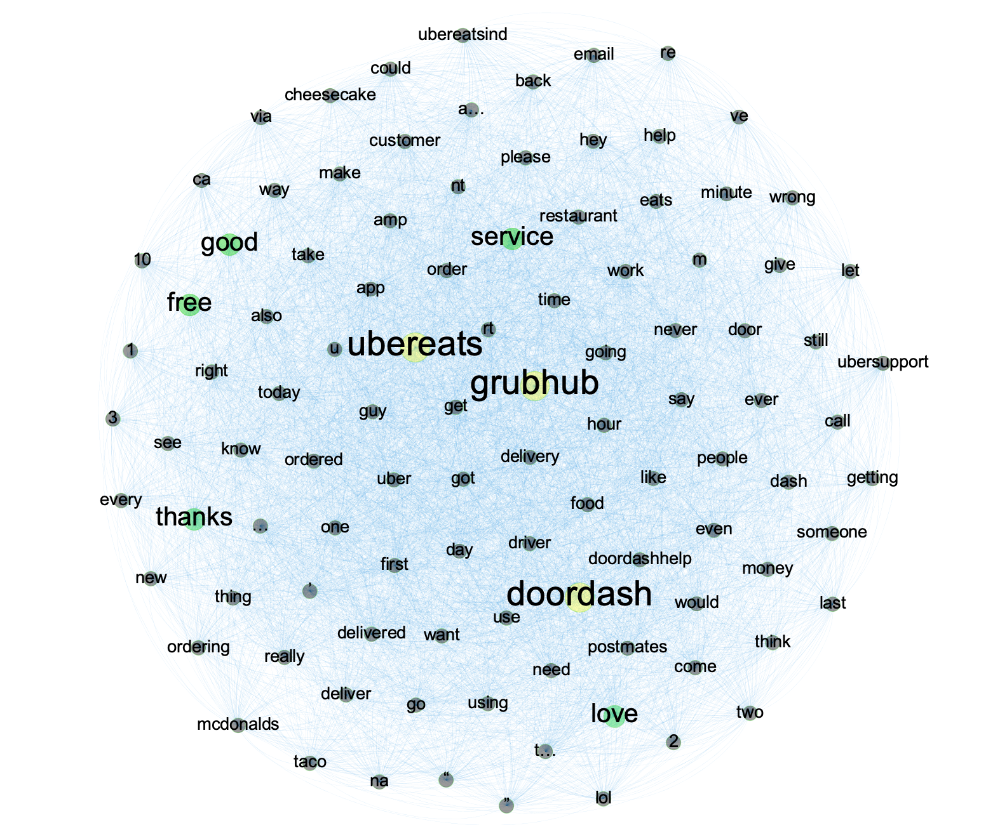

In [46]:
Image(filename='sentiment.png', width=700, height=700)

This visualization is filtered to only show words from tweets with a sentiment score of above 0. Anything above 0 is nuetral or positive, and below 0 would display more negative words. The visualization highlights the three brands, as well as a few positive words that are most often tweeted at these brands. 